In [1]:
import json
import os
import numpy as np
import pandas as pd
import torch
import pickle

from PivotTree import *
from RuleTree import *

import pandas as pd
from sklearn.model_selection import train_test_split
from itertools import product
import time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import silhouette_score, roc_auc_score, balanced_accuracy_score, f1_score, accuracy_score, recall_score, precision_score
from sklearn.model_selection import train_test_split


def generate_param_configurations(configurations):
    keys, values_list = zip(*configurations.items())
    param_combinations = list(product(*values_list))

    result_configurations = []
    for combination in param_combinations:
        config_dict = dict(zip(keys, combination))
        result_configurations.append(config_dict)

    return result_configurations


In [2]:
train_file = open('./oral_datas/data/oral2_train_features.json')
train_data = json.load(train_file)
train_file.close()

test_file = open('./oral_datas/data/oral2_test_features.json')
test_data = json.load(test_file)
test_file.close()

val_file = open('./oral_datas/data/oral2_val_features.json')
val_data = json.load(val_file)
val_file.close()

In [3]:
names = []
classes = []
feats = []

for key, value in train_data.items():
    feats.append(value[0]['features'])

In [4]:
def create_df(data_json):
    feats = []
    classes = []
    names = []
    
    for key, value in data_json.items():
        feats.append(value[0]['features'])
        classes.append(value[0]['type'])
        names.append(key)

    df =  pd.DataFrame(feats)
    df['class'] = classes
    df['names'] = names

    return df
    

In [5]:
train_df = create_df(train_data)
val_df = create_df(val_data)
test_df = create_df(test_data)

In [6]:
train_df.shape[0] + val_df.shape[0] + test_df.shape[0]

556

In [11]:
name = train_val_df.iloc[20]['names']

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.transform import resize
import matplotlib.patches as patches

In [13]:
path = './oral_datas/data/images/' + name
img = mpimg.imread(path)

img = resize(img, (800, 800))
roi = train_data[name][0]['roi']

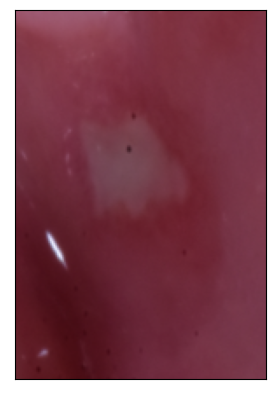

In [15]:
# Extract the region within the box
x1, y1, x2, y2 = roi
cropped_img = img[int(y1):int(y2), int(x1):int(x2)]

# Display the cropped image
plt.imshow(cropped_img)
plt.xticks([])
plt.yticks([])
plt.show()

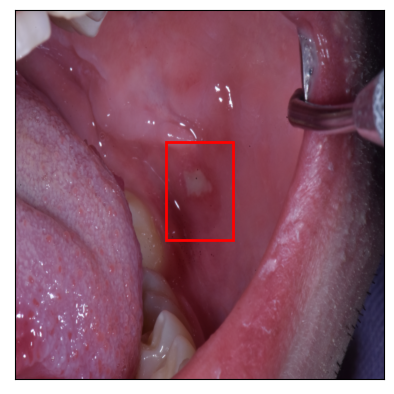

In [16]:
x1, y1, x2, y2 = roi
plt.imshow(img)
rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
plt.gca().add_patch(rect)

plt.xticks([])
plt.yticks([])
plt.show()

In [18]:
X_train = np.array(train_val_df.drop(columns = ['class','names']))
y_train = np.array(train_val_df['class'])

X_test = np.array(test_df.drop(columns = ['class','names']))
y_test = np.array(test_df['class'])

In [19]:
X_train.shape[0] + X_test.shape[0]

535

In [20]:
dict_disease = {0: 'neoplastic' , 1 : 'aphthous' , 2 : 'traumatic' }

In [21]:
np.unique(list(y_train) + list(y_test), return_counts=True)[0], np.unique(list(y_train) + list(y_test), return_counts=True)[1]

(array([0, 1, 2]), array([169, 174, 192]))

In [22]:
[x / (len(y_train) + len(y_test)) for x in np.unique(list(y_train) + list(y_test), return_counts=True)[1] ]

[0.31588785046728973, 0.3252336448598131, 0.35887850467289717]

In [23]:
start_pairwise = time.process_time()
X_train_matrix  = pairwise_distances(X_train, metric = 'euclidean')
end_pairwise = time.process_time()

In [27]:
#best_configurations_validations

In [24]:
from sklearn.metrics import f1_score, precision_score, recall_score, balanced_accuracy_score

In [25]:
dt = DecisionTreeClassifier(max_depth=4, min_samples_leaf = 3, min_samples_split = 5, random_state = 0)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)

# Calculate Balanced Accuracy
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)


# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)


Balanced Accuracy: 0.7796592775041051
F1: 0.7757965973945508
Precision: 0.7800351530190239
Recall: 0.7796592775041051


In [35]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import balanced_accuracy_score, f1_score, precision_score, recall_score
import numpy as np

# Initialize lists to store metric values
balanced_accuracies = []
f1_scores = []
precisions = []
recalls = []

# Define parameters for the DecisionTreeClassifier
max_depth = 4
min_samples_leaf = 3
min_samples_split = 5

# Loop over 50 random states
for random_state in range(50):
    # Create and fit the DecisionTreeClassifier
    dt = DecisionTreeClassifier(max_depth=max_depth, 
                                min_samples_leaf=min_samples_leaf, 
                                min_samples_split=min_samples_split, 
                                random_state=random_state)
    dt.fit(X_train, y_train)
    
    # Predict on test set
    y_pred = dt.predict(X_test)
    
    # Calculate metrics
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    
    # Append metrics to lists
    balanced_accuracies.append(balanced_accuracy)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)


avg_balanced_accuracy = np.mean(balanced_accuracies)
avg_f1_score = np.mean(f1_scores)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)


std_balanced_accuracy = np.std(balanced_accuracies)
std_f1_score = np.std(f1_scores)
std_precision = np.std(precisions)
std_recall = np.std(recalls)

print('Average Balanced Accuracy:', avg_balanced_accuracy)
print('Average F1 Score:', avg_f1_score)
print('Average Precision:', avg_precision)
print('Average Recall:', avg_recall)
print('--------------------------------')
print('Standard Deviation Balanced Accuracy:', std_balanced_accuracy)
print('Standard Deviation F1 Score:', std_f1_score)
print('Standard Deviation Precision:', std_precision)
print('Standard Deviation Recall:', std_recall)


Average Balanced Accuracy: 0.7707009441707717
Average F1 Score: 0.7657055162614839
Average Precision: 0.7721653492589965
Average Recall: 0.7707009441707717
--------------------------------
Standard Deviation Balanced Accuracy: 0.009549305530304864
Standard Deviation F1 Score: 0.01094513705268616
Standard Deviation Precision: 0.008582297851595148
Standard Deviation Recall: 0.009549305530304864


In [36]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)


balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)


f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)


precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)

recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)

Balanced Accuracy: 0.8098316912972084
F1: 0.8084118016321407
Precision: 0.8114434669273379
Recall: 0.8098316912972084


In [26]:
#best_config_KNN_mapped

#for comparison, we use the best configuration for PT from the validation

pt = PivotTree(max_depth=4, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

pt.fit(X_train, y_train)
print('PivotTree')
print(pt.print_tree())
print('')

y_pred, leaves, rules = pt.predict(X_test, get_leaf=True, get_rule=True)

lista_pivs = [node.pivot_used for key, node in pt._node_dict.items() if node.pivot_used]

len(lista_pivs)

balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)

f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)

precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)


recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)


PivotTree
[(True, ['node_id: 0  pivot: 252'], [1.0], 23.64181423187256, False, 0), (True, ['node_id: 1  pivot: 197'], [1.0], 15.578277111053467, False, 1), (False, 1, 3, 0.006726457399103139, 3, 2), (True, ['node_id: 4  pivot: 401'], [1.0], 13.752326488494873, False, 2), (False, 2, 3, 0.006726457399103139, 7, 3), (False, 0, 106, 0.23766816143497757, 8, 3), (True, ['node_id: 2  pivot: 33'], [1.0], 27.922550201416016, False, 1), (True, ['node_id: 5  pivot: 436'], [1.0], 19.29819393157959, False, 2), (False, 1, 7, 0.01569506726457399, 9, 3), (True, ['node_id: 10  pivot: 322'], [1.0], 16.743935585021973, False, 3), (False, 1, 6, 0.013452914798206279, 15, 4), (False, 2, 112, 0.25112107623318386, 16, 4), (True, ['node_id: 6  pivot: 134'], [1.0], 29.921874046325684, False, 2), (True, ['node_id: 11  pivot: 348'], [1.0], 15.016557693481445, False, 3), (False, 0, 5, 0.011210762331838564, 17, 4), (False, 1, 76, 0.17040358744394618, 18, 4), (True, ['node_id: 12  pivot: 283'], [1.0], 34.17602729797

In [27]:
from sklearn.metrics import balanced_accuracy_score, f1_score, precision_score, recall_score
import numpy as np

# Initialize lists to store metric values
balanced_accuracies = []
f1_scores = []
precisions = []
recalls = []
num_pivots = []

# Define parameters for the PivotTree model
max_depth = 4

# Loop over 50 random states
for random_state in range(50):
   
    pt = PivotTree(max_depth=max_depth, random_state=random_state, prune_tree=True,
                   force_oblique_splits=False, allow_oblique_splits=False,
                   pivot_oblique_choice_features=None)
    pt.fit(X_train, y_train)
    
 
    y_pred, leaves, rules = pt.predict(X_test, get_leaf=True, get_rule=True)

    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')

    pivots = len([node.pivot_used for node in list(pt._node_dict.values()) if node.pivot_used  != None])

    balanced_accuracies.append(balanced_accuracy)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)
    num_pivots.append(pivots)


avg_balanced_accuracy = np.mean(balanced_accuracies)
avg_f1_score = np.mean(f1_scores)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_num_pivots = np.mean(num_pivots)

std_balanced_accuracy = np.std(balanced_accuracies)
std_f1_score = np.std(f1_scores)
std_precision = np.std(precisions)
std_recall = np.std(recalls)
std_num_pivots = np.std(num_pivots)

print('Average Balanced Accuracy:', avg_balanced_accuracy)
print('Average F1 Score:', avg_f1_score)
print('Average Precision:', avg_precision)
print('Average Recall:', avg_recall)
print('Average num_pivots:', avg_num_pivots)

print('--------------------------------')
print('Standard Deviation Balanced Accuracy:', std_balanced_accuracy)
print('Standard Deviation F1 Score:', std_f1_score)
print('Standard Deviation Precision:', std_precision)
print('Standard Deviation Recall:', std_recall)
print('Standard Deviation num_pivots:', std_num_pivots)


Average Balanced Accuracy: 0.8338977832512317
Average F1 Score: 0.8318007662835248
Average Precision: 0.8389940033085195
Average Recall: 0.8338977832512317
Average num_pivots: 9.0
--------------------------------
Standard Deviation Balanced Accuracy: 0.0
Standard Deviation F1 Score: 1.1102230246251565e-16
Standard Deviation Precision: 1.1102230246251565e-16
Standard Deviation Recall: 0.0
Standard Deviation num_pivots: 0.0


In [28]:
pt = PivotTree(max_depth=3, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

pt.fit(X_train, y_train)

lista_pivs_knn = [node.pivot_used for key, node in pt._node_dict.items() if node.pivot_used]
len(lista_pivs_knn)

5

In [29]:
pt = PivotTree(max_depth=3, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

pt.fit(X_train, y_train)

lista_pivs_knn = [node.pivot_used for key, node in pt._node_dict.items() if node.pivot_used]

knn_pivots = [int(x[0].split()[-1])for x in lista_pivs_knn]
X_train[knn_pivots], y_train[knn_pivots]

# Create a KNN model with k = 5
knn_model = KNeighborsClassifier(n_neighbors=5)

X_train_reduced = pairwise_distances(X_train, X_train[knn_pivots], metric = 'euclidean')
X_test_reduced = pairwise_distances(X_test, X_train[knn_pivots], metric = 'euclidean')

# Train the KNN model
knn_model.fit(X_train_reduced, y_train)

# Make predictions on the test data
y_pred = knn_model.predict(X_test_reduced)

# Calculate the F1 score
f1 = f1_score(y_test, y_pred, average = 'macro')

# Calculate Balanced Accuracy
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)

# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)

Balanced Accuracy: 0.8113197865353038
F1: 0.8075156643110106
Precision: 0.8096348096348097
Recall: 0.8113197865353038


In [57]:
balanced_accuracies = []
f1_scores = []
precisions = []
recalls = []
num_pivots = []


max_depth = 3
random_state = 0  

for random_state in range(50):

    pt = PivotTree(max_depth=3, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)
    
    pt.fit(X_train, y_train)
    
    lista_pivs_knn = [node.pivot_used for key, node in pt._node_dict.items() if node.pivot_used]

    knn_pivots = [int(x[0].split()[-1])for x in lista_pivs_knn]
    X_train[knn_pivots], y_train[knn_pivots]
    

    knn_model = KNeighborsClassifier(n_neighbors=5)
    
    X_train_reduced = pairwise_distances(X_train, X_train[knn_pivots], metric = 'euclidean')
    X_test_reduced = pairwise_distances(X_test, X_train[knn_pivots], metric = 'euclidean')

    knn_model.fit(X_train_reduced, y_train)

    y_pred = knn_model.predict(X_test_reduced)
    

    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')

    pivots = len(lista_pivs_knn)
    
    balanced_accuracies.append(balanced_accuracy)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)
    num_pivots.append(pivots)

avg_balanced_accuracy = np.mean(balanced_accuracies)
avg_f1_score = np.mean(f1_scores)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_num_pivots = np.mean(num_pivots)


std_balanced_accuracy = np.std(balanced_accuracies)
std_f1_score = np.std(f1_scores)
std_precision = np.std(precisions)
std_recall = np.std(recalls)
std_num_pivots = np.std(num_pivots)


print('Average Balanced Accuracy:', avg_balanced_accuracy)
print('Average F1 Score:', avg_f1_score)
print('Average Precision:', avg_precision)
print('Average Recall:', avg_recall)
print('Average num_pivots:', avg_num_pivots)

print('--------------------------------')
print('Standard Deviation Balanced Accuracy:', std_balanced_accuracy)
print('Standard Deviation F1 Score:', std_f1_score)
print('Standard Deviation Precision:', std_precision)
print('Standard Deviation Recall:', std_recall)
print('Standard Deviation num_pivots:', std_num_pivots)


Average Balanced Accuracy: 0.811319786535304
Average F1 Score: 0.8075156643110105
Average Precision: 0.8096348096348096
Average Recall: 0.811319786535304
Average num_pivots: 5.0
--------------------------------
Standard Deviation Balanced Accuracy: 2.220446049250313e-16
Standard Deviation F1 Score: 1.1102230246251565e-16
Standard Deviation Precision: 1.1102230246251565e-16
Standard Deviation Recall: 2.220446049250313e-16
Standard Deviation num_pivots: 0.0


In [48]:
pt = PivotTree(max_depth=4, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

pt.fit(X_train, y_train)

lista_pivs_dt = [node.descriptive_pivot_indexes for key, node in pt._node_dict.items() ]
lista_pivs_dt += [node.discriminative_pivot_indexes for key, node in pt._node_dict.items()]


In [49]:
dt_pivots = np.array(list(set(sum([list(x) for x in lista_pivs_dt if type(x) != type(None)], []))))
dt_pivots.shape

(47,)

In [50]:
dt_model = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 3, min_samples_split = 5, random_state = 0)

X_train_reduced = pairwise_distances(X_train, X_train[dt_pivots], metric = 'euclidean')
X_test_reduced = pairwise_distances(X_test, X_train[dt_pivots],  metric = 'euclidean')

# Train the KNN model
dt_model.fit(X_train_reduced, y_train)

# Make predictions on the test data
y_pred = dt_model.predict(X_test_reduced)

# Calculate Balanced Accuracy
balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)

# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)

# Calculate Precision
precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)

# Calculate Recall
recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)


Balanced Accuracy: 0.8332307060755336
F1: 0.8308223477715003
Precision: 0.8307447232178414
Recall: 0.8332307060755336


In [51]:
balanced_accuracies = []
f1_scores = []
precisions = []
recalls = []
num_pivots = []

# Define parameters for the PivotTree model
max_depth = 3
random_state = 0  # Note: This might not be relevant depending on your PivotTree implementation

# Loop over 50 random states
for random_state in range(50):
    # Initialize and train PivotTree model
    pt = PivotTree(max_depth=4, random_state=random_state, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

    pt.fit(X_train, y_train)
    
    lista_pivs_dt = [node.descriptive_pivot_indexes for key, node in pt._node_dict.items() ]
    lista_pivs_dt += [node.discriminative_pivot_indexes for key, node in pt._node_dict.items()]

    dt_pivots = np.array(list(set(sum([list(x) for x in lista_pivs_dt if type(x) != type(None)], []))))
    dt_pivots.shape

    dt_model = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 3, min_samples_split = 5, random_state = 0)

    X_train_reduced = pairwise_distances(X_train, X_train[dt_pivots], metric = 'euclidean')
    X_test_reduced = pairwise_distances(X_test, X_train[dt_pivots],  metric = 'euclidean')
    
    # Train the KNN model
    dt_model.fit(X_train_reduced, y_train)
    
    # Make predictions on the test data
    y_pred = dt_model.predict(X_test_reduced)
    
    # Calculate metrics
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')

    pivots = len(dt_pivots)
    
    # Append metrics to lists
    balanced_accuracies.append(balanced_accuracy)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)
    num_pivots.append(pivots)

# Calculate average metrics
avg_balanced_accuracy = np.mean(balanced_accuracies)
avg_f1_score = np.mean(f1_scores)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_num_pivots = np.mean(num_pivots)

# Calculate standard deviation of metrics
std_balanced_accuracy = np.std(balanced_accuracies)
std_f1_score = np.std(f1_scores)
std_precision = np.std(precisions)
std_recall = np.std(recalls)
std_num_pivots = np.std(num_pivots)

# Print average metrics and standard deviations
print('Average Balanced Accuracy:', avg_balanced_accuracy)
print('Average F1 Score:', avg_f1_score)
print('Average Precision:', avg_precision)
print('Average Recall:', avg_recall)
print('Average num_pivots:', avg_num_pivots)

print('--------------------------------')
print('Standard Deviation Balanced Accuracy:', std_balanced_accuracy)
print('Standard Deviation F1 Score:', std_f1_score)
print('Standard Deviation Precision:', std_precision)
print('Standard Deviation Recall:', std_recall)
print('Standard Deviation num_pivots:', std_num_pivots)


Average Balanced Accuracy: 0.8332307060755336
Average F1 Score: 0.8308223477715003
Average Precision: 0.8307447232178414
Average Recall: 0.8332307060755336
Average num_pivots: 47.18
--------------------------------
Standard Deviation Balanced Accuracy: 0.0
Standard Deviation F1 Score: 0.0
Standard Deviation Precision: 0.0
Standard Deviation Recall: 0.0
Standard Deviation num_pivots: 0.7922120928135344


In [30]:
pt = PivotTree(max_depth=4, random_state=0, prune_tree = True,
               force_oblique_splits = False, allow_oblique_splits = False, 
               pivot_oblique_choice_features = None)

pt.fit(X_train, y_train)
used_pivots= [node.pivot_used for key, node in pt._node_dict.items() if node.pivot_used]

In [32]:
used_pivots

[['node_id: 0  pivot: 252'],
 ['node_id: 1  pivot: 197'],
 ['node_id: 2  pivot: 33'],
 ['node_id: 4  pivot: 401'],
 ['node_id: 5  pivot: 436'],
 ['node_id: 6  pivot: 134'],
 ['node_id: 10  pivot: 322'],
 ['node_id: 11  pivot: 348'],
 ['node_id: 12  pivot: 283']]

In [57]:
from skimage.metrics import structural_similarity
from skimage.transform import resize
import cv2
import numpy as np

def resizing(img):
    return cv2.resize(img, dsize=(800, 800), interpolation=cv2.INTER_CUBIC)

def resizing_small(img):
    return cv2.resize(img, dsize=(300, 300), interpolation=cv2.INTER_CUBIC)

def crop_img(img, roi):
    x1, y1, x2, y2 = roi
    cropped_img = img[int(y1):int(y2), int(x1):int(x2)]
    return cropped_img

In [58]:
dict_disease = {0: 'neoplastic' , 1 : 'aphthous' , 2 : 'traumatic' }

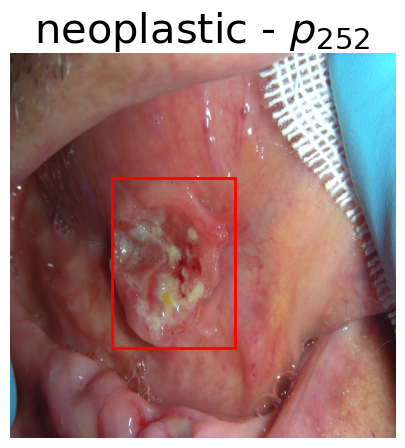

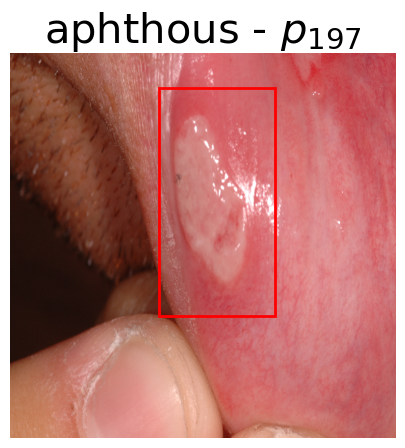

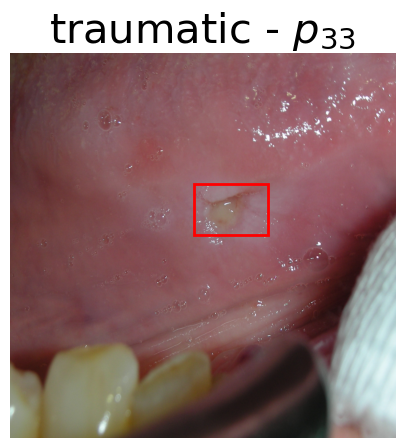

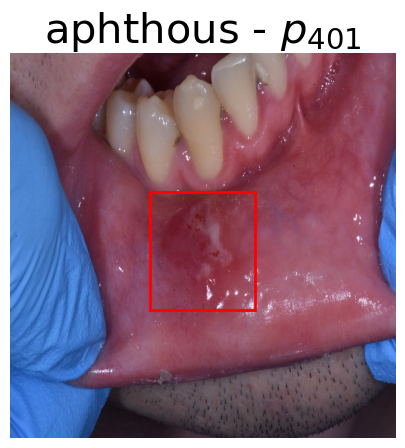

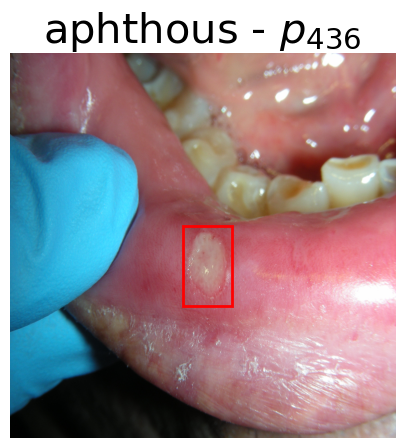

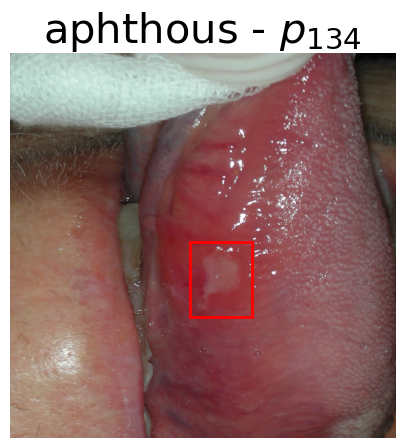

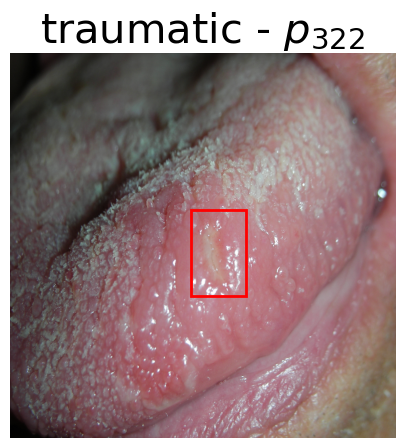

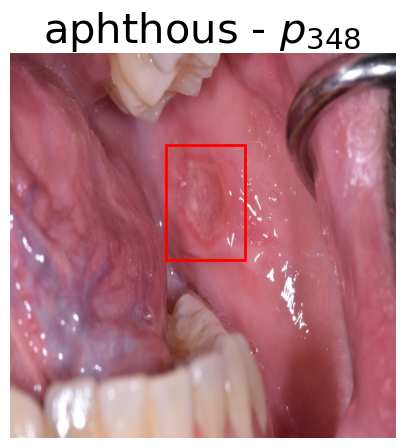

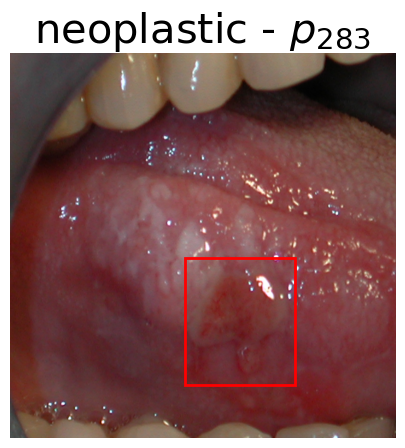

In [59]:
for used_piv in [x for x in used_pivots if x != None]:
    if used_pivots != None:
        idnx = int((used_piv[0].split()[-1]))
        name = train_val_df.iloc[idnx]['names']
        class_ref = dict_disease[train_val_df.iloc[idnx]['class']]


        path_img = './data/images/' + name
        img = resizing(mpimg.imread(path_img))
        
        plt.figure(figsize=(10, 5))
        plt.title(f"{class_ref} - $p_{{{idnx}}}$", fontsize=30)
        
        
        try:
            roi = train_data[name][0]['roi']
        except:
            roi = val_data[name][0]['roi']
            
        x1, y1, x2, y2 = roi
        plt.imshow(img)
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
        plt.gca().add_patch(rect)
        plt.axis('off')  # Turn off axis
        plt.savefig('./' + str(idnx) + '_' + 'img_pivots.png', format = 'png', bbox_inches = 'tight' , dpi = 300)
        plt.show()
        
    

In [60]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [61]:
def extract_pivots_rows(dataframe, class_inp):
    idxs = []
    rows = []
    for lista_pivot in used_pivots:
        if lista_pivot == None:
            continue

        print(lista_pivot[0].split())
        index_pivot = int(lista_pivot[0].split()[-1])

        idxs +=[index_pivot]
        rows += [dataframe.iloc[index_pivot]]

    df = pd.DataFrame(rows)
    df.index = idxs
    return df.sort_values(by = 'class')

In [62]:
used_pivots_df = extract_pivots_rows(train_val_df, 0)

['node_id:', '0', 'pivot:', '252']
['node_id:', '1', 'pivot:', '197']
['node_id:', '2', 'pivot:', '33']
['node_id:', '4', 'pivot:', '401']
['node_id:', '5', 'pivot:', '436']
['node_id:', '6', 'pivot:', '134']
['node_id:', '10', 'pivot:', '322']
['node_id:', '11', 'pivot:', '348']
['node_id:', '12', 'pivot:', '283']


In [63]:
import matplotlib.image as mpimg
import pandas as pd
import os

# Assuming train_val_df, dict_disease, train_data, val_data, and resizing function are already defined

def load_image_and_roi(used_piv):
    idnx = int((used_piv[0].split()[-1]))
    name = train_val_df.iloc[idnx]['names']
    class_ref = dict_disease[train_val_df.iloc[idnx]['class']]

    path_img = './data/images/' + name
    img = resizing(mpimg.imread(path_img))

    try:
        roi = train_data[name][0]['roi']
    except KeyError:
        roi = val_data[name][0]['roi']
        
    x1, y1, x2, y2 = roi
    return img, (x1, y1, x2, y2), class_ref, idnx, name

images_data = [load_image_and_roi(used_piv) for used_piv in used_pivots if used_piv is not None]


In [64]:
##results with original prototypes
#consider the prototypes from the doc file:

aftose = ['11-04-2008 015.jpg','cd5d60f84df046fa6b0c22467d33232b.jpg','f0247b99044e0eb68b435e1cdb9f2bd7.jpg']
traumatiche = ['DSCN8419 .jpg','DSC_3645.JPG']
neoplastiche = ['DSC_1888.JPG','DSCN2477.jpg','DSC_5396.JPG','c17830633234c9220b95959adbef8851.JPG']

aftose_df = train_df[train_df['names'].isin(aftose)]
traumatiche_df = train_df[train_df['names'].isin(traumatiche)]
neoplastiche_df = train_df[train_df['names'].isin(neoplastiche)]

aftose_df.index.tolist()

original_prots = pd.concat((aftose_df,traumatiche_df,neoplastiche_df)).drop(columns = ['names','class']).values


In [66]:
knn_model = KNeighborsClassifier(n_neighbors=5)

X_train_reduced = pairwise_distances(X_train, original_prots, metric = 'euclidean')
X_test_reduced = pairwise_distances(X_test, original_prots,  metric = 'euclidean')

knn_model.fit(X_train_reduced, y_train)


y_pred = knn_model.predict(X_test_reduced)


balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)


f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)


precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)


recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)

Balanced Accuracy: 0.8013136288998358
F1: 0.7953006770211072
Precision: 0.7980392156862747
Recall: 0.8013136288998358


In [68]:

dt_model = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 3, min_samples_split = 5, random_state = 0)

X_train_reduced = pairwise_distances(X_train, original_prots, metric = 'euclidean')
X_test_reduced = pairwise_distances(X_test, original_prots,  metric = 'euclidean')


dt_model.fit(X_train_reduced, y_train)


y_pred = dt_model.predict(X_test_reduced)


balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print('Balanced Accuracy:', balanced_accuracy)


f1 = f1_score(y_test, y_pred, average='macro')
print('F1:', f1)


precision = precision_score(y_test, y_pred, average='macro')
print('Precision:', precision)


recall = recall_score(y_test, y_pred, average='macro')
print('Recall:', recall)

Balanced Accuracy: 0.7307060755336617
F1: 0.7296119085592769
Precision: 0.7304311645082436
Recall: 0.7307060755336617


In [70]:
from sklearn.metrics import balanced_accuracy_score, f1_score, precision_score, recall_score
import numpy as np

balanced_accuracies = []
f1_scores = []
precisions = []
recalls = []
num_pivots = []

max_depth = 3
random_state = 0  # Note: This might not be relevant depending on your PivotTree implementation

# Loop over 50 random states
for random_state in range(50):
       
    dt_model = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 3, min_samples_split = 5, random_state = random_state)
    
    X_train_reduced = pairwise_distances(X_train, original_prots, metric = 'euclidean')
    X_test_reduced = pairwise_distances(X_test, original_prots,  metric = 'euclidean')
  
    dt_model.fit(X_train_reduced, y_train)

    y_pred = dt_model.predict(X_test_reduced)
        

    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')

    pivots = len([])

    balanced_accuracies.append(balanced_accuracy)
    f1_scores.append(f1)
    precisions.append(precision)
    recalls.append(recall)
    num_pivots.append(pivots)

avg_balanced_accuracy = np.mean(balanced_accuracies)
avg_f1_score = np.mean(f1_scores)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_num_pivots = np.mean(num_pivots)


std_balanced_accuracy = np.std(balanced_accuracies)
std_f1_score = np.std(f1_scores)
std_precision = np.std(precisions)
std_recall = np.std(recalls)
std_num_pivots = np.std(num_pivots)


print('Average Balanced Accuracy:', avg_balanced_accuracy)
print('Average F1 Score:', avg_f1_score)
print('Average Precision:', avg_precision)
print('Average Recall:', avg_recall)
print('Average num_pivots:', avg_num_pivots)

print('--------------------------------')
print('Standard Deviation Balanced Accuracy:', std_balanced_accuracy)
print('Standard Deviation F1 Score:', std_f1_score)
print('Standard Deviation Precision:', std_precision)
print('Standard Deviation Recall:', std_recall)
print('Standard Deviation num_pivots:', std_num_pivots)


Average Balanced Accuracy: 0.7394560755336618
Average F1 Score: 0.7385834691766765
Average Precision: 0.7423182837569997
Average Recall: 0.7394560755336618
Average num_pivots: 0.0
--------------------------------
Standard Deviation Balanced Accuracy: 0.006705615391429636
Standard Deviation F1 Score: 0.006880444228776267
Standard Deviation Precision: 0.009358367420714908
Standard Deviation Recall: 0.006705615391429636
Standard Deviation num_pivots: 0.0


In [71]:
original_prots = pd.concat((aftose_df,traumatiche_df,neoplastiche_df)).sort_values(by = 'class')

In [73]:
original_prots_dict_name = {row['names'] : f"{dict_disease[row['class']]} - $o_{{{i}}}$" for i, row in original_prots.iterrows()}
original_prots_dict_name 

reverse_original_prots_dict_name = {}
for key, value in original_prots_dict_name.items():
    reverse_original_prots_dict_name[value] = key
    
reverse_original_prots_dict_name
    

{'neoplastic - $o_{152}$': 'c17830633234c9220b95959adbef8851.JPG',
 'neoplastic - $o_{223}$': 'DSC_5396.JPG',
 'neoplastic - $o_{147}$': 'DSC_1888.JPG',
 'neoplastic - $o_{7}$': 'DSCN2477.jpg',
 'aphthous - $o_{383}$': 'cd5d60f84df046fa6b0c22467d33232b.jpg',
 'aphthous - $o_{49}$': 'f0247b99044e0eb68b435e1cdb9f2bd7.jpg',
 'aphthous - $o_{382}$': '11-04-2008 015.jpg',
 'traumatic - $o_{8}$': 'DSCN8419 .jpg',
 'traumatic - $o_{123}$': 'DSC_3645.JPG'}

In [74]:
original_prots.index

Index([152, 223, 147, 7, 383, 49, 382, 8, 123], dtype='int64')

In [75]:
used_pivots_df

,0,1,2,3,4,5,6,7,8,9,...,248,249,250,251,252,253,254,255,class,names
252,1.696018,0.047213,1.115694,0.990940,-1.517209,-3.040646,0.505165,-4.614714,-1.100738,-0.597982,...,-2.400745,4.857698,0.476686,-0.194973,0.638142,0.513088,-2.710300,2.187266,0,b5cba561f3b78f82888e82ede2b373c5.JPG
283,0.364015,-1.787166,3.015990,-0.732836,-2.393367,-1.887769,0.151229,-3.659612,-1.416876,-2.123466,...,-5.576922,2.794580,-1.562063,-1.089223,-0.357978,1.958592,0.072540,-1.144581,0,87032ead0946c23ffc6e4cae2752945f.JPG
401,0.586281,0.632979,1.762958,-0.626521,-2.941714,-1.738754,-0.795653,-4.028666,-2.052744,-1.823724,...,-3.868999,1.261109,-0.545448,-1.313982,-0.798012,1.702319,0.386506,0.783161,1,DSC_2979.JPG
197,1.663762,-0.186761,0.493271,2.867963,-0.040117,-2.054777,0.319887,-3.451855,-1.998729,-0.471928,...,-2.828704,1.985202,-0.380427,-1.460799,-1.265786,0.888088,-3.299298,-0.865615,1,DSC_5044.JPG
348,1.260659,0.523637,1.913762,-0.511002,-0.920147,-1.259095,1.113057,-5.436615,-3.417609,-1.542333,...,-3.585397,1.410009,0.272049,-0.281378,-0.360713,0.036775,-2.310652,-0.715129,1,DSC_8707.JPG
134,-1.528928,-1.403910,4.577237,-0.515178,-0.565694,-1.974761,-0.727046,-6.529862,-0.851094,-2.201324,...,-4.845856,0.935115,-0.908219,0.525065,-1.125064,2.208101,0.457926,-2.043020,1,3797c453eab2827efe6773af3dd61e9d.jpg
436,-1.199340,1.016329,2.590289,-0.761624,-0.964334,-2.504341,-0.846931,-3.939054,-0.228066,-0.325844,...,-3.458255,1.582742,-1.350822,-0.951674,0.075469,1.349002,-1.727298,0.791054,1,162367b2b24cbe2e4f4aa6cf839c1895.JPG
33,-0.045981,0.532066,0.497525,-1.130282,-0.727269,-1.345793,-0.759805,-0.836840,0.704835,-0.592726,...,-3.804584,0.741176,-1.171401,-2.491999,2.455897,2.001131,-0.167787,-0.604436,2,c6a240e21455ccc3ff51fcc6cd74116a.jpg
322,0.075194,0.817573,1.119411,-0.399109,-0.959839,-1.653089,-0.690812,-3.489530,-1.729968,-1.889302,...,-1.814494,-0.260471,1.024235,-3.681162,-0.398708,1.010028,-1.237469,-0.854712,2,28-05-2008 017.jpg


In [76]:
used_pivots_df_dict_name = {row['names'] :  f"{dict_disease[row['class']]} - $p_{{{i}}}$" for i, row in used_pivots_df.iterrows()}
used_pivots_df_dict_name

reverse_used_pivots_df_dict_name = {}
for key, value in used_pivots_df_dict_name.items():
    reverse_used_pivots_df_dict_name[value] = key
    

In [77]:
original_prots_dict_name

{'c17830633234c9220b95959adbef8851.JPG': 'neoplastic - $o_{152}$',
 'DSC_5396.JPG': 'neoplastic - $o_{223}$',
 'DSC_1888.JPG': 'neoplastic - $o_{147}$',
 'DSCN2477.jpg': 'neoplastic - $o_{7}$',
 'cd5d60f84df046fa6b0c22467d33232b.jpg': 'aphthous - $o_{383}$',
 'f0247b99044e0eb68b435e1cdb9f2bd7.jpg': 'aphthous - $o_{49}$',
 '11-04-2008 015.jpg': 'aphthous - $o_{382}$',
 'DSCN8419 .jpg': 'traumatic - $o_{8}$',
 'DSC_3645.JPG': 'traumatic - $o_{123}$'}

In [78]:
from scipy.spatial.distance import cdist

distance_matrix = cdist(used_pivots_df.drop(columns = ['class','names']).values,
                        original_prots.drop(columns = ['class','names']).values,                                   
                                           )


row_names = [used_pivots_df_dict_name[x] for x in used_pivots_df.names]
col_names = [original_prots_dict_name[x] for x in original_prots.names]

distance_matrix = pd.DataFrame(distance_matrix)
distance_matrix.columns = col_names

distance_matrix.insert(0, 'used_p', row_names)

distance_matrix

,used_p,neoplastic - $o_{152}$,neoplastic - $o_{223}$,neoplastic - $o_{147}$,neoplastic - $o_{7}$,aphthous - $o_{383}$,aphthous - $o_{49}$,aphthous - $o_{382}$,traumatic - $o_{8}$,traumatic - $o_{123}$
0,neoplastic - $p_{252}$,19.921929,20.402849,20.308279,19.261656,30.681338,32.812235,32.614713,28.701289,21.413951
1,neoplastic - $p_{283}$,28.961526,30.642569,20.732979,31.198657,29.930947,32.750984,37.755373,34.684712,24.823578
2,aphthous - $p_{401}$,23.835855,16.562459,20.209697,23.902359,27.273145,29.199307,26.210613,25.034804,14.594226
3,aphthous - $p_{197}$,22.244293,19.480883,22.105098,25.107439,27.615456,27.071806,21.816794,22.799808,20.712635
4,aphthous - $p_{348}$,24.874148,22.779089,26.253685,28.637071,23.027242,30.475309,20.390808,21.119611,23.240076
5,aphthous - $p_{134}$,30.622465,31.808433,32.095023,36.508561,13.233944,24.060218,28.655126,25.802097,30.974005
6,aphthous - $p_{436}$,27.663923,29.840134,31.532656,34.119253,19.324856,28.051155,23.273168,19.962682,29.253362
7,traumatic - $p_{33}$,29.406385,30.946496,34.361908,36.241123,32.375334,37.690417,31.552883,26.297075,30.184849
8,traumatic - $p_{322}$,25.410339,22.858412,27.856934,30.066902,26.626184,35.241328,19.333687,20.279121,21.636883


In [79]:
def info_dist_matr(distance_matrix):

    distance_matrix = distance_matrix
    min_distance = np.min(distance_matrix)
    max_distance = np.max(distance_matrix)
    mean_distance = np.mean(distance_matrix)
    std_distance = np.std(distance_matrix)
    
    print("Minimum distance:", min_distance)
    print("Maximum distance:", max_distance)
    print("Mean distance:", mean_distance)
    print("Standard deviation of distances:", std_distance)


In [80]:
from scipy.spatial.distance import cdist


euclidean_dist_matr = cdist(train_val_df.drop(columns = ['class','names']).values,
                       train_val_df.drop(columns = ['class','names']).values)   

euclidean_dist_matr = np.array([x for x in np.concatenate(euclidean_dist_matr) if x > 0])
euclidean_dist_matr.shape

(198470,)

### Heatmap visualization

In [85]:
from scipy.spatial.distance import cdist

#Compute the distance matrix using the defined metric
distance_matrix = cdist(used_pivots_df.drop(columns = ['class','names']).values,
                        original_prots.drop(columns = ['class','names']).values,                                   
                                           )


row_names = [used_pivots_df_dict_name[x]  for x in used_pivots_df.names]
col_names = [original_prots_dict_name[x]  for x in original_prots.names]

distance_matrix = pd.DataFrame(distance_matrix)
distance_matrix.columns = col_names

distance_matrix.insert(0, 'used_p', row_names)

distance_matrix

,used_p,neoplastic - $o_{152}$,neoplastic - $o_{223}$,neoplastic - $o_{147}$,neoplastic - $o_{7}$,aphthous - $o_{383}$,aphthous - $o_{49}$,aphthous - $o_{382}$,traumatic - $o_{8}$,traumatic - $o_{123}$
0,neoplastic - $p_{252}$,19.921929,20.402849,20.308279,19.261656,30.681338,32.812235,32.614713,28.701289,21.413951
1,neoplastic - $p_{283}$,28.961526,30.642569,20.732979,31.198657,29.930947,32.750984,37.755373,34.684712,24.823578
2,aphthous - $p_{401}$,23.835855,16.562459,20.209697,23.902359,27.273145,29.199307,26.210613,25.034804,14.594226
3,aphthous - $p_{197}$,22.244293,19.480883,22.105098,25.107439,27.615456,27.071806,21.816794,22.799808,20.712635
4,aphthous - $p_{348}$,24.874148,22.779089,26.253685,28.637071,23.027242,30.475309,20.390808,21.119611,23.240076
5,aphthous - $p_{134}$,30.622465,31.808433,32.095023,36.508561,13.233944,24.060218,28.655126,25.802097,30.974005
6,aphthous - $p_{436}$,27.663923,29.840134,31.532656,34.119253,19.324856,28.051155,23.273168,19.962682,29.253362
7,traumatic - $p_{33}$,29.406385,30.946496,34.361908,36.241123,32.375334,37.690417,31.552883,26.297075,30.184849
8,traumatic - $p_{322}$,25.410339,22.858412,27.856934,30.066902,26.626184,35.241328,19.333687,20.279121,21.636883


In [86]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def add_image(ax, img, position, zoom=1.0, offset=(0, 0)):
    imagebox = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(imagebox, position, frameon=False, pad=0, xybox=offset, xycoords='data')
    ax.add_artist(ab)

def add_image(ax, img, xy, zoom=0.1, offset=(0, 0)):
    imagebox = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(imagebox, (xy[0] + offset[0], xy[1] + offset[1]), frameon=False)
    ax.add_artist(ab)



In [87]:
column_heatmap_names = list(distance_matrix.used_p)
row_heatmap_names = list(distance_matrix.columns[1:])

In [88]:
def short_string_label(x):
    prot = x.split()[-1]
    label = x.split()[0][0]
    return ' '.join([label, '-', prot])

In [89]:
column_heatmap_names = [short_string_label(x) for x in column_heatmap_names]
row_heatmap_names = [short_string_label(x) for x in row_heatmap_names]

In [90]:
images_col = [cv2.imread(f'./heatmap_vis/{file}.png') for file in list(used_pivots_df.names)]
images_row = [cv2.imread(f'./heatmap_vis/{file}.png') for file in list(original_prots.names)]

images_col = [cv2.imread(f'./oral_datas/data/images/{file}') for file in list(used_pivots_df.names)]
images_row = [cv2.imread(f'./oral_datas/data/images/{file}') for file in list(original_prots.names)]

In [91]:
images_col = [cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) for img_bgr in images_col]
images_row = [cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) for img_bgr in images_row]

In [92]:
resize_dim = (128, 128)  # Smaller size for thumbnails
images_row = [cv2.resize(img, resize_dim) for img in images_row]
images_col = [cv2.resize(img, resize_dim) for img in images_col]

In [93]:
num_images = len(images_col)

In [94]:
matrix = [list(x[1:]) for x in distance_matrix.values]

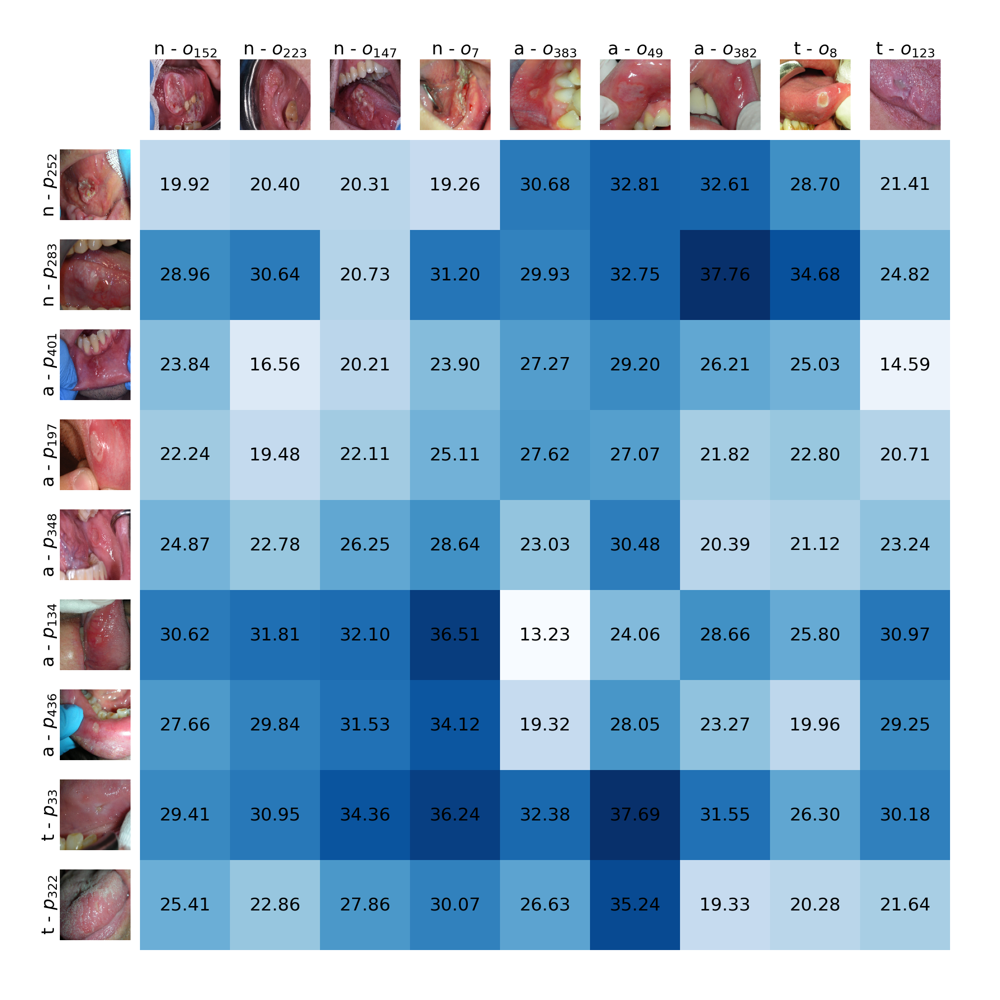

In [95]:
# Create a heatmap
fig, ax = plt.subplots(figsize=(26, 26))
cax = ax.matshow(matrix, cmap=plt.cm.Blues)

# Add colorbar
#plt.colorbar(cax)

ax.set_xticks(np.arange(num_images))
ax.set_yticks(np.arange(num_images))

# Add image thumbnails and titles to the x and y axes
for i in range(num_images):
    # x-axis (top)
    add_image(ax, images_row[i], (i, -0.5), zoom=0.8, offset=(0, -0.5))
    ax.text(i, -1.5, row_heatmap_names[i], ha='center', va='center', fontsize=26)
    
    # y-axis (left)
    add_image(ax, images_col[i], (-0.5, i), zoom=0.8, offset=(-0.5, 0))
    ax.text(-1.5, i, column_heatmap_names[i], ha='center', va='center', fontsize=26, rotation=90)


for i in range(num_images):
    for j in range(num_images):
        value = f"{np.array(matrix)[i, j]:.2f}"  # Format value with 2 decimal places
        ax.text(j, i, value, ha='center', va='center', color='black', fontsize=26)


# Turn off the axis

plt.axis('off')

ax.set_xlim(-2, num_images)
ax.set_ylim(num_images, -2)

# Save the figure
plt.savefig('./heatmap_with_images_euclid.png', bbox_inches='tight')


plt.show()


In [96]:
used_pivots_df.names

252    b5cba561f3b78f82888e82ede2b373c5.JPG
283    87032ead0946c23ffc6e4cae2752945f.JPG
401                            DSC_2979.JPG
197                            DSC_5044.JPG
348                            DSC_8707.JPG
134    3797c453eab2827efe6773af3dd61e9d.jpg
436    162367b2b24cbe2e4f4aa6cf839c1895.JPG
33     c6a240e21455ccc3ff51fcc6cd74116a.jpg
322                      28-05-2008 017.jpg
Name: names, dtype: object

In [97]:
row_heatmap_names

['n - $o_{152}$',
 'n - $o_{223}$',
 'n - $o_{147}$',
 'n - $o_{7}$',
 'a - $o_{383}$',
 'a - $o_{49}$',
 'a - $o_{382}$',
 't - $o_{8}$',
 't - $o_{123}$']

In [98]:
original_prots.names

152    c17830633234c9220b95959adbef8851.JPG
223                            DSC_5396.JPG
147                            DSC_1888.JPG
7                              DSCN2477.jpg
383    cd5d60f84df046fa6b0c22467d33232b.jpg
49     f0247b99044e0eb68b435e1cdb9f2bd7.jpg
382                      11-04-2008 015.jpg
8                             DSCN8419 .jpg
123                            DSC_3645.JPG
Name: names, dtype: object

In [99]:
from skimage.metrics import normalized_mutual_information, variation_of_information, mean_squared_error

b5cba561f3b78f82888e82ede2b373c5.JPG n - $p_{252}$


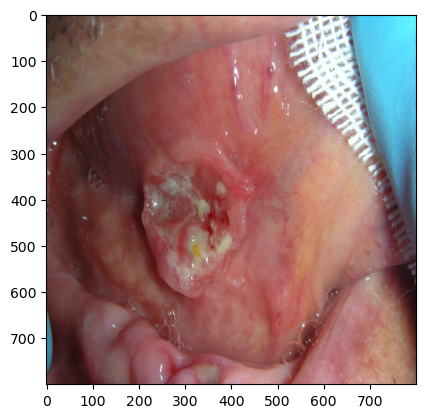

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.3891700431464411
DSC_5396.JPG
STRUCT SIM 0.4646947037704412
DSC_1888.JPG
STRUCT SIM 0.4221871201001748
DSCN2477.jpg
STRUCT SIM 0.45656238900087853
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.6033427983494102
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.5880701454362425
11-04-2008 015.jpg
STRUCT SIM 0.5632348461396175
DSCN8419 .jpg
STRUCT SIM 0.48098361403734263
DSC_3645.JPG
STRUCT SIM 0.4405758545794514
87032ead0946c23ffc6e4cae2752945f.JPG n - $p_{283}$


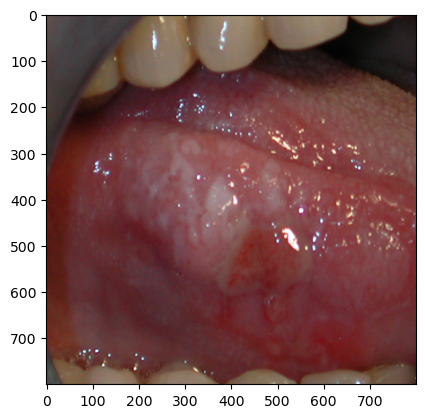

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.45578781985701927
DSC_5396.JPG
STRUCT SIM 0.5079071791586353
DSC_1888.JPG
STRUCT SIM 0.5186056130366388
DSCN2477.jpg
STRUCT SIM 0.4742847334140894
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.7245533113998982
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.6964485711261053
11-04-2008 015.jpg
STRUCT SIM 0.6897849692242494
DSCN8419 .jpg
STRUCT SIM 0.4986241897820814
DSC_3645.JPG
STRUCT SIM 0.48461603190192887
DSC_2979.JPG a - $p_{401}$


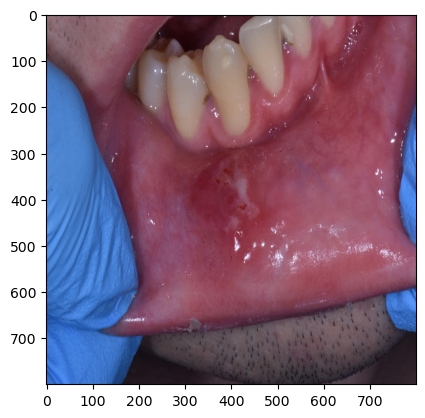

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.4397260144842641
DSC_5396.JPG
STRUCT SIM 0.50506774909113
DSC_1888.JPG
STRUCT SIM 0.49796057812931743
DSCN2477.jpg
STRUCT SIM 0.4692141655754866
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.7037060953766461
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.6490870006870854
11-04-2008 015.jpg
STRUCT SIM 0.6655837570038273
DSCN8419 .jpg
STRUCT SIM 0.4713368463237895
DSC_3645.JPG
STRUCT SIM 0.4716153413244681
DSC_5044.JPG a - $p_{197}$


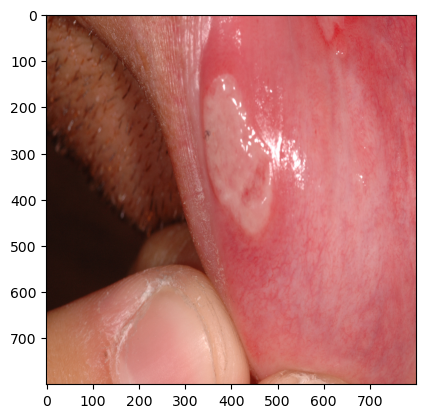

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.40176902147941335
DSC_5396.JPG
STRUCT SIM 0.48128264487984174
DSC_1888.JPG
STRUCT SIM 0.4157322980609955
DSCN2477.jpg
STRUCT SIM 0.453793451213745
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.6413309355909317
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.6179025955382774
11-04-2008 015.jpg
STRUCT SIM 0.5932877746199121
DSCN8419 .jpg
STRUCT SIM 0.55066782261738
DSC_3645.JPG
STRUCT SIM 0.49059531884232893
DSC_8707.JPG a - $p_{348}$


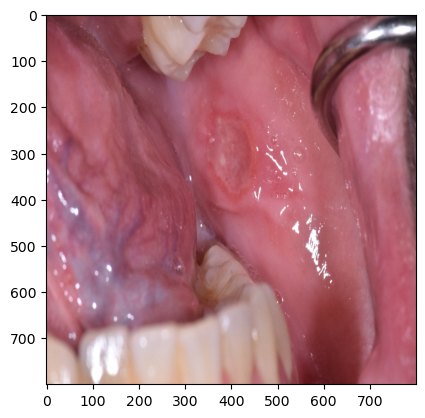

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.46852024798142583
DSC_5396.JPG
STRUCT SIM 0.5412925143569988
DSC_1888.JPG
STRUCT SIM 0.4753996473221795
DSCN2477.jpg
STRUCT SIM 0.5199810367656584
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.745631795634014
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.7255893582667916
11-04-2008 015.jpg
STRUCT SIM 0.6967452886219134
DSCN8419 .jpg
STRUCT SIM 0.5978129108344822
DSC_3645.JPG
STRUCT SIM 0.5633704843991545
3797c453eab2827efe6773af3dd61e9d.jpg a - $p_{134}$


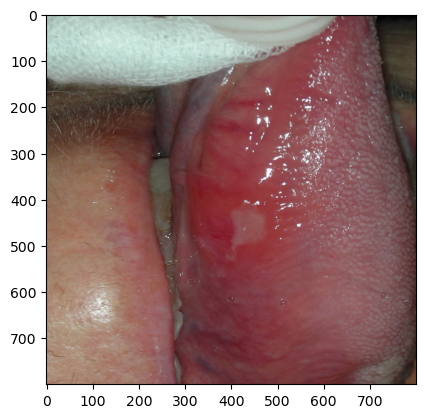

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.4892038099975416
DSC_5396.JPG
STRUCT SIM 0.5864554448199627
DSC_1888.JPG
STRUCT SIM 0.5661427159327735
DSCN2477.jpg
STRUCT SIM 0.5267146630831543
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.8373581248947594
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.7662534202446096
11-04-2008 015.jpg
STRUCT SIM 0.7597903535141289
DSCN8419 .jpg
STRUCT SIM 0.5690077607032753
DSC_3645.JPG
STRUCT SIM 0.5429006901870442
162367b2b24cbe2e4f4aa6cf839c1895.JPG a - $p_{436}$


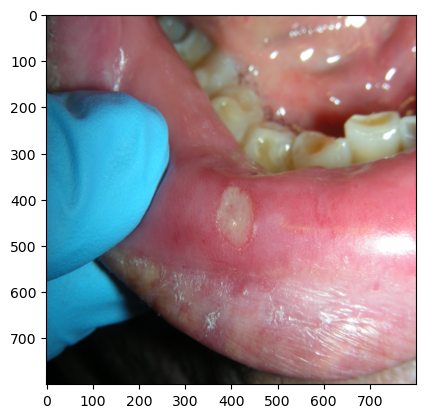

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.45580564996630746
DSC_5396.JPG
STRUCT SIM 0.5403046862739912
DSC_1888.JPG
STRUCT SIM 0.45105186486814364
DSCN2477.jpg
STRUCT SIM 0.5053193550507403
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.7157094253662152
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.6913737747096378
11-04-2008 015.jpg
STRUCT SIM 0.6442678484010959
DSCN8419 .jpg
STRUCT SIM 0.6108069171219509
DSC_3645.JPG
STRUCT SIM 0.5466611832584907
c6a240e21455ccc3ff51fcc6cd74116a.jpg t - $p_{33}$


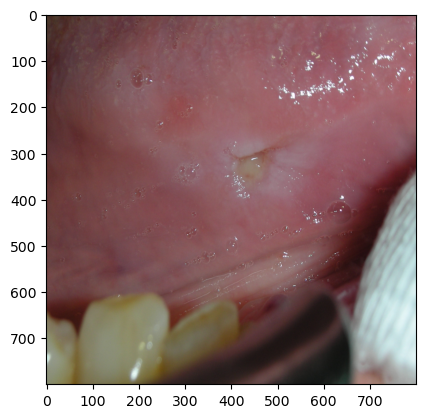

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.4647971578274175
DSC_5396.JPG
STRUCT SIM 0.5586598841967345
DSC_1888.JPG
STRUCT SIM 0.47235330330096253
DSCN2477.jpg
STRUCT SIM 0.5247496746900533
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.7419620221951168
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.7373154738169688
11-04-2008 015.jpg
STRUCT SIM 0.692077481018174
DSCN8419 .jpg
STRUCT SIM 0.6402500938254524
DSC_3645.JPG
STRUCT SIM 0.578876749367166
28-05-2008 017.jpg t - $p_{322}$


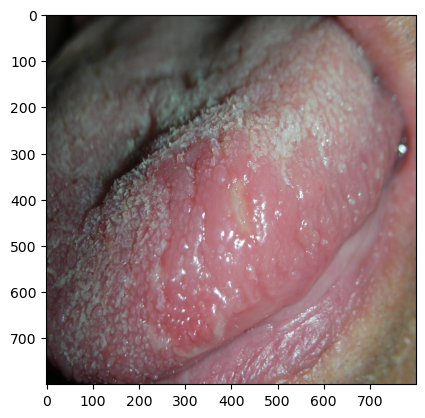

c17830633234c9220b95959adbef8851.JPG
STRUCT SIM 0.3911614898913041
DSC_5396.JPG
STRUCT SIM 0.4522614904911479
DSC_1888.JPG
STRUCT SIM 0.37249970134322025
DSCN2477.jpg
STRUCT SIM 0.44215147593838705
cd5d60f84df046fa6b0c22467d33232b.jpg
STRUCT SIM 0.6066172581335075
f0247b99044e0eb68b435e1cdb9f2bd7.jpg
STRUCT SIM 0.5994004996241099
11-04-2008 015.jpg
STRUCT SIM 0.5544348037737749
DSCN8419 .jpg
STRUCT SIM 0.5651885501351459
DSC_3645.JPG
STRUCT SIM 0.4801629401015159


In [79]:
ssim_matrix = []

for name_prot, prot_name in zip(list(used_pivots_df.names),column_heatmap_names):
    
    path = './oral_datas/data/images/'
        
    try:
        roi1 = train_data[name_prot][0]['roi']
    except:
        roi1= val_data[name_prot][0]['roi']

    prot_img = resizing(mpimg.imread(path + name_prot))
    cropped_prot_img = resizing_small(crop_img(prot_img,roi1))

    print(name_prot, prot_name)
    plt.imshow(prot_img)
    plt.show()
    
    row = [] 
    
    for original_prot_name in list(original_prots.names):
        try:
            roi2 = train_data[original_prot_name][0]['roi']
        except:
            roi2 = val_data[original_prot_name][0]['roi']

        print(original_prot_name)
        #plt.imshow(original_img)
        plt.show()
        
        original_img = resizing(mpimg.imread(path + original_prot_name))
        cropped_original_img= resizing_small(crop_img(original_img,roi2))

        struc_sim = structural_similarity(cropped_prot_img,cropped_original_img, channel_axis = 2)
        
        row.append(struc_sim)
        print(f'STRUCT SIM {struc_sim}' )
        
    ssim_matrix += [row]
                
            

In [80]:
df_ssim_matrix = pd.DataFrame(ssim_matrix)
df_ssim_matrix.columns =  row_heatmap_names
df_ssim_matrix.index = column_heatmap_names


In [139]:
for class_label in ['n', 'a', 't']:
    filtered_df = df_ssim_matrix.loc[
    df_ssim_matrix.index.str.contains(class_label), 
    df_ssim_matrix.columns.str.contains(class_label)
]
    print(class_label)
    print(filtered_df.values,end = '\n\n')
    filtered_df = filtered_df.values
    print(filtered_df.flatten())
    print(np.mean(filtered_df.flatten()))
    
   

n
[[0.38917004 0.4646947  0.42218712 0.45656239]
 [0.45578782 0.50790718 0.51860561 0.47428473]]

[0.38917004 0.4646947  0.42218712 0.45656239 0.45578782 0.50790718
 0.51860561 0.47428473]
0.4611499501855398
a
[[0.7037061  0.649087   0.66558376]
 [0.64133094 0.6179026  0.59328777]
 [0.7456318  0.72558936 0.69674529]
 [0.83735812 0.76625342 0.75979035]
 [0.71570943 0.69137377 0.64426785]]

[0.7037061  0.649087   0.66558376 0.64133094 0.6179026  0.59328777
 0.7456318  0.72558936 0.69674529 0.83735812 0.76625342 0.75979035
 0.71570943 0.69137377 0.64426785]
0.6969078365646565
t
[[0.64025009 0.57887675]
 [0.56518855 0.48016294]]

[0.64025009 0.57887675 0.56518855 0.48016294]
0.56611958335732


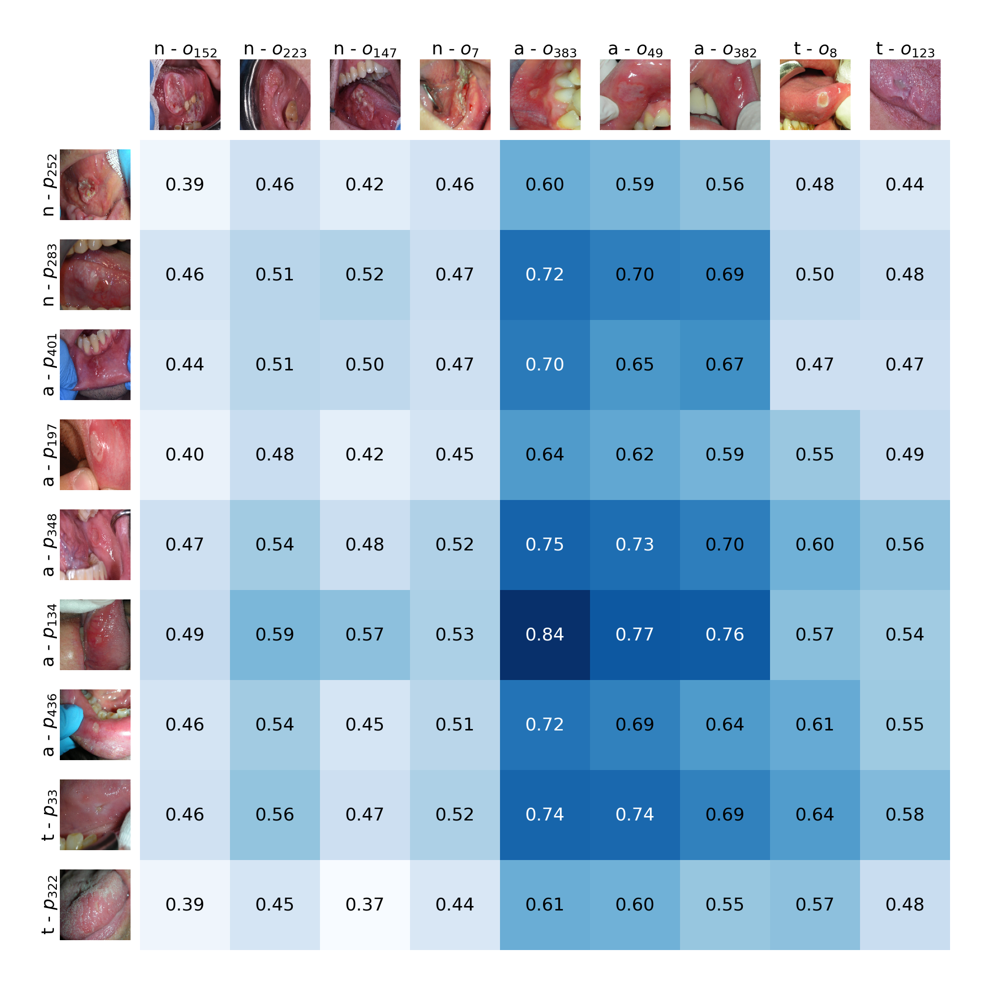

In [98]:
# Create a heatmap
fig, ax = plt.subplots(figsize=(26, 26))
cax = ax.matshow(ssim_matrix, cmap=plt.cm.Blues)

# Add colorbar
# plt.colorbar(cax)

ax.set_xticks(np.arange(num_images))
ax.set_yticks(np.arange(num_images))

# Add image thumbnails and titles to the x and y axes
for i in range(num_images):
    # x-axis (top)
    add_image(ax, images_row[i], (i, -0.5), zoom=0.8, offset=(0, -0.5))
    ax.text(i, -1.5, row_heatmap_names[i], ha='center', va='center', fontsize=26)
    
    # y-axis (left)
    add_image(ax, images_col[i], (-0.5, i), zoom=0.8, offset=(-0.5, 0))
    ax.text(-1.5, i, column_heatmap_names[i], ha='center', va='center', fontsize=26, rotation=90)

threshold = 0.7

for i in range(num_images):
    for j in range(num_images):
        value = f"{np.array(ssim_matrix)[i, j]:.2f}"  # Format value with 2 decimal places
        color = 'white' if np.array(ssim_matrix)[i, j] > threshold else 'black'
        ax.text(j, i, value, ha='center', va='center', color=color, fontsize=26)





# Turn off the axis

plt.axis('off')

ax.set_xlim(-2, num_images)
ax.set_ylim(num_images, -2)

# Save the figure
plt.savefig('./heatmap_with_images_ssim.png', bbox_inches='tight')


plt.show()


### Clusters analysis


In [194]:
from scipy.stats import entropy

In [195]:
from sklearn.metrics.pairwise import pairwise_distances_argmin_min
from sklearn.metrics import silhouette_score
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


def compute_entropy(labels, base=None):
  value,counts = np.unique(labels, return_counts=True)
  return entropy(counts, base=base)

In [196]:
original_prots

,0,1,2,3,4,5,6,7,8,9,...,248,249,250,251,252,253,254,255,class,names
152,0.305795,-0.026890,1.025100,0.402895,2.894923,-2.362463,0.330789,-1.921795,-0.532148,-1.514548,...,1.271482,2.785913,1.468681,-1.258278,-0.497552,-0.343086,-2.333636,1.965265,0,c17830633234c9220b95959adbef8851.JPG
223,2.911994,0.298471,-0.158761,0.597194,-2.221991,-2.541699,-0.903631,-2.521858,-2.613308,-1.031271,...,-2.868298,2.654347,0.663355,-0.568698,-0.048446,0.605007,-0.988365,2.185053,0,DSC_5396.JPG
147,1.308100,-1.109356,-1.056313,-0.653133,-0.487829,-1.979071,0.917313,-2.392581,-0.116841,-0.731944,...,-3.872828,2.928749,-2.018547,-1.795294,0.749765,0.764594,-1.441298,1.617731,0,DSC_1888.JPG
7,2.665196,-0.632226,-0.843288,2.107335,-3.365458,-4.281412,-0.392695,-1.903096,-1.982199,-1.164581,...,-3.490139,3.674051,-0.685587,0.700814,1.225029,-0.609804,-1.862708,1.881031,0,DSCN2477.jpg
383,-1.399596,-1.456591,4.483904,-1.703633,-0.930362,-3.434147,-1.077740,-5.177496,-0.601441,-1.748676,...,-4.985671,1.267323,-2.217785,0.326402,-1.019265,1.033087,-0.111494,0.039121,1,cd5d60f84df046fa6b0c22467d33232b.jpg
49,-1.397392,-0.060074,2.896660,-1.206516,-1.709179,-4.631032,-1.491493,-5.859100,-1.418082,-1.113713,...,-4.496777,0.071599,-2.116163,1.868909,-1.439278,1.035035,0.192000,-1.267899,1,f0247b99044e0eb68b435e1cdb9f2bd7.jpg
382,0.998289,2.093587,2.113806,-0.398326,-0.812390,-3.720755,-0.681338,-1.999969,-2.326944,-1.473356,...,-1.931459,-0.232631,-0.881102,-1.925590,-1.284188,-0.416357,-1.601550,1.171081,1,11-04-2008 015.jpg
8,0.628305,1.160125,2.509334,-0.643203,-2.029464,-3.145494,-0.456994,-1.610905,-2.473000,-1.227525,...,-1.357101,-0.847075,-2.092156,-2.309942,-0.981750,1.536994,-0.939686,1.297134,2,DSCN8419 .jpg
123,2.095901,-0.897772,-0.323577,-0.031118,-2.039379,-2.293107,-0.106629,-2.109439,-2.636419,-0.540150,...,-4.091353,1.301582,-1.084254,-2.575057,0.955561,0.338294,-0.878882,1.458743,2,DSC_3645.JPG


In [197]:
row_heatmap_names

['n - $o_{152}$',
 'n - $o_{223}$',
 'n - $o_{147}$',
 'n - $o_{7}$',
 'a - $o_{383}$',
 'a - $o_{49}$',
 'a - $o_{382}$',
 't - $o_{8}$',
 't - $o_{123}$']

In [181]:
labels, values = pairwise_distances_argmin_min(np.array(list(X_train) + list(X_test)), original_prots.drop(columns = ['names','class']))

In [202]:
y = np.array(list(y_train)+list(y_test))
class_distribution_cluster = {}
entropy_cluster = {}
cluster_size = {}
majority_class_num = {}

for clust_label in set(labels):
    idx = np.where(labels == clust_label)
    y_temp = y[idx]
    cluster_size[clust_label] = len(y_temp)
    list_val = []
    list_val_raw = []
    for k in [0,1,2]:
        list_val_raw += ([len([x for x in y_temp if x == k])])
        list_val += [len([x for x in y_temp if x == k]) / len(y_temp)]
        
    majority_class_num[clust_label] = np.max(list_val_raw)
    class_distribution_cluster[clust_label] = list_val

    entropy_cluster[clust_label] = compute_entropy(y_temp)

In [203]:
majority_class_num

{0: 50, 1: 48, 2: 18, 3: 3, 4: 35, 5: 5, 6: 71, 7: 97, 8: 43}

In [183]:
class_distribution_cluster, list(class_distribution_cluster.values()), list(cluster_size.values())

({0: [0.9615384615384616, 0.038461538461538464, 0.0],
  1: [0.5714285714285714, 0.21428571428571427, 0.21428571428571427],
  2: [0.8181818181818182, 0.13636363636363635, 0.045454545454545456],
  3: [1.0, 0.0, 0.0],
  4: [0.0, 0.9722222222222222, 0.027777777777777776],
  5: [0.0, 0.8333333333333334, 0.16666666666666666],
  6: [0.016260162601626018, 0.5772357723577236, 0.4065040650406504],
  7: [0.03816793893129771, 0.22137404580152673, 0.7404580152671756],
  8: [0.5512820512820513, 0.14102564102564102, 0.3076923076923077]},
 [[0.9615384615384616, 0.038461538461538464, 0.0],
  [0.5714285714285714, 0.21428571428571427, 0.21428571428571427],
  [0.8181818181818182, 0.13636363636363635, 0.045454545454545456],
  [1.0, 0.0, 0.0],
  [0.0, 0.9722222222222222, 0.027777777777777776],
  [0.0, 0.8333333333333334, 0.16666666666666666],
  [0.016260162601626018, 0.5772357723577236, 0.4065040650406504],
  [0.03816793893129771, 0.22137404580152673, 0.7404580152671756],
  [0.5512820512820513, 0.1410256410

In [184]:
class_distributions =  list(class_distribution_cluster.values())
entropy_cluster_list = list(entropy_cluster.values())
cluster_size_list = list(cluster_size.values())

In [185]:
cluster_size_list

[52, 84, 22, 3, 36, 6, 123, 131, 78]

In [187]:
entropy_cluster_list

[0.16302362949436594,
 0.9799711820833054,
 0.5763820666248933,
 0.0,
 0.12693054534140227,
 0.45056120886630463,
 0.7500891041329005,
 0.6809550823873624,
 0.9671992766388744]

In [192]:
np.unique(labels, return_counts = True)[1]  * 100 / len(labels)

array([ 9.71962617, 15.70093458,  4.11214953,  0.56074766,  6.72897196,
        1.12149533, 22.99065421, 24.48598131, 14.57943925])

In [193]:
cluster_sizes = np.unique(labels, return_counts = True)[1]  * 100 / len(labels)
cluster_sizes

array([ 9.71962617, 15.70093458,  4.11214953,  0.56074766,  6.72897196,
        1.12149533, 22.99065421, 24.48598131, 14.57943925])

/tmp/ipykernel_2040723/1965683461.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0 + i for i in range(0, 40, 5)], fontsize=18)


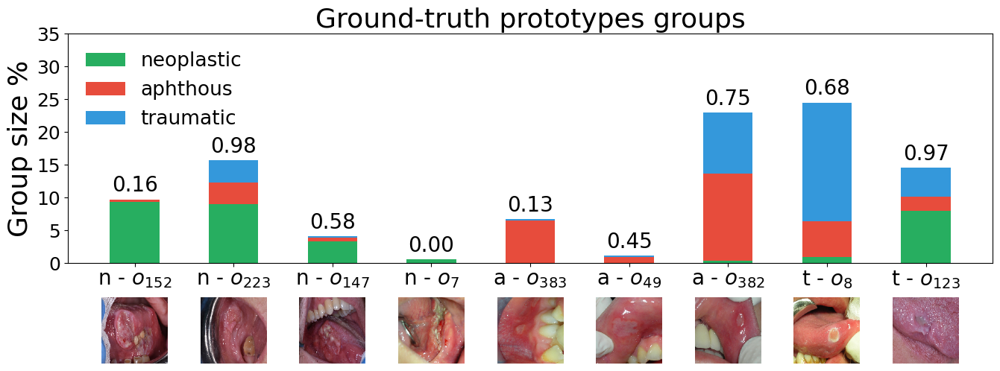

In [164]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage,AnnotationBbox

def offset_image(coord, img, ax):
    img = img
    im = OffsetImage(img, zoom=0.5)
    im.image.axes = ax

    ab = AnnotationBbox(im, (coord, 0),  xybox=(0., -65.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)

    ax.add_artist(ab)

clust_names = [i for i in range(len(cluster_sizes))]
cluster_sizes

colors = ['#27ae60', '#e74c3c', '#3498db']

fig, ax = plt.subplots(figsize=(16, 4))


for i, (size, distribution) in enumerate(zip(cluster_sizes, class_distributions)):
    bottom = 0
    for j, (fraction, color) in enumerate(zip(distribution, colors)):
        bars = ax.bar(i, size * fraction, width=0.5, align='center', bottom=bottom, color=color, edgecolor = None, 
               label=f'{dict_disease[j]}' if i == 0 else "")
        bottom += size * fraction

        if j == len(distribution) - 1:  # Only place text after the last segment
            text_y = bottom + 0.5  # Adjust the value as needed
            ax.text(i, text_y, f'{entropy_cluster_list[i]:.2f}', ha='center', va='bottom', fontsize=20)


# Set the ticks and labels
ax.set_xticks(range(len(clust_names)))
ax.set_xticklabels(clust_names)
ax.set_ylabel('Group size %', fontsize=26)
ax.set_xticklabels([], fontsize=26)
ax.tick_params(axis='x', which='major', pad=26)
ax.set_yticklabels([0 + i for i in range(0, 40, 5)], fontsize=18)
ax.set_ylim([0, 35])

# Add images below the x-axis
for i, img in enumerate(images_row):
    offset_image(i, img, ax)
    ax.text(i, -2.5, row_heatmap_names[i], ha='center', va='center', fontsize=20)
    
# Display legend
ax.legend(loc = 'upper left', fontsize = 19, frameon = False)

plt.title('Ground-truth prototypes groups', fontsize = 26)
plt.savefig('./original_clusters_ttl.png', bbox_inches='tight', dpi = 300)
plt.show()




In [165]:
used_pivots_df

,0,1,2,3,4,5,6,7,8,9,...,248,249,250,251,252,253,254,255,class,names
252,1.696018,0.047213,1.115694,0.990940,-1.517209,-3.040646,0.505165,-4.614714,-1.100738,-0.597982,...,-2.400745,4.857698,0.476686,-0.194973,0.638142,0.513088,-2.710300,2.187266,0,b5cba561f3b78f82888e82ede2b373c5.JPG
283,0.364015,-1.787166,3.015990,-0.732836,-2.393367,-1.887769,0.151229,-3.659612,-1.416876,-2.123466,...,-5.576922,2.794580,-1.562063,-1.089223,-0.357978,1.958592,0.072540,-1.144581,0,87032ead0946c23ffc6e4cae2752945f.JPG
401,0.586281,0.632979,1.762958,-0.626521,-2.941714,-1.738754,-0.795653,-4.028666,-2.052744,-1.823724,...,-3.868999,1.261109,-0.545448,-1.313982,-0.798012,1.702319,0.386506,0.783161,1,DSC_2979.JPG
197,1.663762,-0.186761,0.493271,2.867963,-0.040117,-2.054777,0.319887,-3.451855,-1.998729,-0.471928,...,-2.828704,1.985202,-0.380427,-1.460799,-1.265786,0.888088,-3.299298,-0.865615,1,DSC_5044.JPG
348,1.260659,0.523637,1.913762,-0.511002,-0.920147,-1.259095,1.113057,-5.436615,-3.417609,-1.542333,...,-3.585397,1.410009,0.272049,-0.281378,-0.360713,0.036775,-2.310652,-0.715129,1,DSC_8707.JPG
134,-1.528928,-1.403910,4.577237,-0.515178,-0.565694,-1.974761,-0.727046,-6.529862,-0.851094,-2.201324,...,-4.845856,0.935115,-0.908219,0.525065,-1.125064,2.208101,0.457926,-2.043020,1,3797c453eab2827efe6773af3dd61e9d.jpg
436,-1.199340,1.016329,2.590289,-0.761624,-0.964334,-2.504341,-0.846931,-3.939054,-0.228066,-0.325844,...,-3.458255,1.582742,-1.350822,-0.951674,0.075469,1.349002,-1.727298,0.791054,1,162367b2b24cbe2e4f4aa6cf839c1895.JPG
33,-0.045981,0.532066,0.497525,-1.130282,-0.727269,-1.345793,-0.759805,-0.836840,0.704835,-0.592726,...,-3.804584,0.741176,-1.171401,-2.491999,2.455897,2.001131,-0.167787,-0.604436,2,c6a240e21455ccc3ff51fcc6cd74116a.jpg
322,0.075194,0.817573,1.119411,-0.399109,-0.959839,-1.653089,-0.690812,-3.489530,-1.729968,-1.889302,...,-1.814494,-0.260471,1.024235,-3.681162,-0.398708,1.010028,-1.237469,-0.854712,2,28-05-2008 017.jpg


In [166]:
labels, values = pairwise_distances_argmin_min(np.array(list(X_train) + list(X_test)), used_pivots_df.drop(columns = ['names','class']))

In [167]:
np.unique(labels, return_counts = True)[1]  * 100 / len(labels)

array([ 9.90654206,  0.56074766, 20.18691589, 16.07476636,  7.47663551,
        2.99065421,  5.42056075,  8.59813084, 28.78504673])

In [168]:
cluster_sizes = np.unique(labels, return_counts = True)[1]  * 100 / len(labels)
cluster_sizes

array([ 9.90654206,  0.56074766, 20.18691589, 16.07476636,  7.47663551,
        2.99065421,  5.42056075,  8.59813084, 28.78504673])

In [169]:
y = np.array(list(y_train)+list(y_test))
class_distribution_cluster = {}
entropy_cluster = {}
cluster_size = {}
for clust_label in set(labels):
    idx = np.where(labels == clust_label)
    y_temp = y[idx]
    cluster_size[clust_label] = len(y_temp)
    list_val = []
    for k in [0,1,2]:
        list_val += [len([x for x in y_temp if x == k]) / len(y_temp)]
    class_distribution_cluster[clust_label] = list_val

    entropy_cluster[clust_label] = compute_entropy(y_temp)



In [170]:
class_distributions =  list(class_distribution_cluster.values())
entropy_cluster_list = list(entropy_cluster.values())
cluster_size_list = list(cluster_size.values())

/tmp/ipykernel_2040723/695459771.py:39: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0 + i for i in range(0, 40, 5)], fontsize=18)


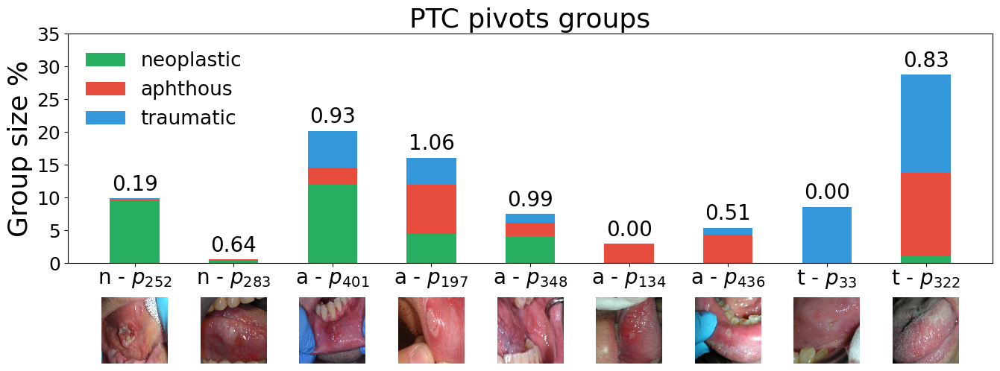

In [175]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage,AnnotationBbox

def offset_image(coord, img, ax):
    img = img
    im = OffsetImage(img, zoom=0.5)
    im.image.axes = ax

    ab = AnnotationBbox(im, (coord, 0),  xybox=(0., -65.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)

    ax.add_artist(ab)

clust_names = [i for i in range(len(cluster_sizes))]
cluster_sizes

fig, ax = plt.subplots(figsize=(16, 4))

# Plot bars for each cluster with color based on class distribution
for i, (size, distribution) in enumerate(zip(cluster_sizes, class_distributions)):
    bottom = 0
    for j, (fraction, color) in enumerate(zip(distribution, colors)):
        ax.bar(i, size * fraction, width=0.5, align='center', bottom=bottom, color=color, 
               label=f'{dict_disease[j]}' if i == 0 else "")
        bottom += size * fraction
        
        if j == len(distribution) - 1:  # Only place text after the last segment
            text_y = bottom + 0.5  # Adjust the value as needed
            ax.text(i, text_y, f'{entropy_cluster_list[i]:.2f}', ha='center', va='bottom', fontsize=20)


# Set the ticks and labels
ax.set_xticks(range(len(clust_names)))
ax.set_xticklabels(clust_names)
ax.set_ylabel('Group size %', fontsize=26)
ax.set_xticklabels([], fontsize=26)
ax.tick_params(axis='x', which='major', pad=26)
ax.set_yticklabels([0 + i for i in range(0, 40, 5)], fontsize=18)

# Add images below the x-axis
for i, img in enumerate(images_col):
    offset_image(i, img, ax)
    ax.text(i, -2.5, column_heatmap_names[i], ha='center', va='center', fontsize=20)

# Display legend

ax.set_ylim([0, 35])

    
# Display legend
ax.legend(loc = 'upper left', fontsize = 19, frameon = False)


plt.title('PTC pivots groups', fontsize = 26)
plt.savefig('./pivot_clusters_ttl.png', bbox_inches='tight', dpi = 300)
plt.show()




In [117]:
for classe in [0,1,2]:
    print(classe, dict_disease[classe])
    pivots_df = used_pivots_df[used_pivots_df['class'] == classe]
    doc_prots_df = original_prots[original_prots['class'] == classe]

    nomi_pivots = [row['names'] for i, row in pivots_df.iterrows()]
    nomi_docs = [row['names'] for i, row in doc_prots_df.iterrows()]
    
    pivots_roi = [train_data[nome][0]['roi'] for nome in nomi_pivots]
    docs_roi = [train_data[nome][0]['roi'] for nome in nomi_docs]
    
    nomi_righe_pivs =[ dict_disease[x] + '_used_' + name for x, name in zip(pivots_df['class'],pivots_df['names'])]
    nomi_righe_doc =[ dict_disease[x] + '_used_' + name for x, name in zip(doc_prots_df['class'],doc_prots_df['names'])]
    
    pivots_imgs = ["./data/images/" + row['names'] for i, row in pivots_df.iterrows()]
    pivots_imgs = [mpimg.imread(file_path) for file_path in pivots_imgs]
    pivots_imgs = [resizing(img) for img in pivots_imgs]

    doc_prots_imgs = ["./data/images/" + row['names'] for i, row in doc_prots_df.iterrows()]
    doc_prots_imgs = [mpimg.imread(file_path) for file_path in doc_prots_imgs]
    doc_prots_imgs = [resizing(img)  for img in doc_prots_imgs]

    
    for img, roi  in zip(pivots_imgs, pivots_roi):
        #display_roi(img,roi)
        pass

    pivots_imgs_cropped = [resizing_small(crop_img(img,roi)) for img, roi in zip(pivots_imgs, pivots_roi)]
    docs_imgs_cropped = [resizing_small(crop_img(img,roi)) for img, roi in zip(doc_prots_imgs, docs_roi)]

    dist_matrix = []
    for img in pivots_imgs_cropped:
        row = []
        for doc_img in docs_imgs_cropped:
           # print('computing')
        
            row.append(structural_similarity(img,doc_img, channel_axis = 2))

        dist_matrix.append(row)
        
    display(pd.DataFrame(dist_matrix))

     


0 neoplastica


,0,1,2,3
0,0.390066,0.446776,0.419359,0.425304
1,0.454057,0.520641,0.456171,0.490003
2,0.408486,0.481633,0.456199,0.424480
3,0.446952,0.501678,0.469965,0.468824
4,0.468252,0.557126,0.492123,0.514192
5,0.396198,0.435728,0.418542,0.417938


1 aftosa


,0,1,2
0,0.772577,0.755143,0.815216
1,0.801958,0.782565,1.000000
2,0.737620,0.708906,0.775338


2 traumatica


,0,1
0,0.607071,0.573334


0 neoplastica


,0,1,2,3,4,5,6,7,8,9,...,248,249,250,251,252,253,254,255,class,names
92,2.374380,-0.717712,0.073832,0.818497,-2.040784,-4.005171,0.998008,-2.611804,-1.942824,-1.549001,...,-3.040148,2.882749,0.092984,-0.411489,-1.027559,1.284126,-1.126936,1.637304,0,DSC_4315.JPG
26,2.051423,1.431816,1.497106,0.961526,-3.302370,-1.832685,-0.369478,-1.258954,-1.486430,-2.045720,...,-1.154277,-1.279468,-1.245107,-3.714799,-0.825051,-0.035991,-1.406942,0.869510,0,DSC_3625.JPG
111,2.531293,0.963667,0.545736,-0.174956,-1.153756,-1.820272,0.648408,-3.062003,-2.232303,-1.354211,...,-2.341418,1.709887,0.399460,-1.091248,0.401107,1.059195,-0.999900,1.501146,0,c8423175d6b75eddce5605e9f9a99abe.JPG
377,0.330257,-0.887519,1.518318,-0.755923,-3.593017,-2.563356,-0.474145,-1.960515,-1.860950,-1.972354,...,-4.333581,0.491240,-2.036752,-1.931439,-0.754766,1.397265,0.491002,0.767585,0,DSCN0692.JPG
171,0.540551,0.394389,3.976233,0.687478,-3.036340,-1.717603,1.064140,-7.612115,-2.372949,-0.698207,...,-3.241437,4.645207,2.657602,1.208411,0.053358,1.381928,-1.039287,-0.040295,0,75225b6ff41f5f6eddbaf78b15d7f4ca.JPG
261,1.855854,0.419618,0.645782,-1.576340,-0.436267,-2.605995,1.106841,-0.151118,-2.711966,-0.184239,...,-0.070625,2.783347,-0.756286,-4.001953,-0.466472,1.844577,-0.450518,4.826352,0,481aee585dcb192cb0aed8edb1e68bac.JPG


ValueError: Input images must have the same dimensions.

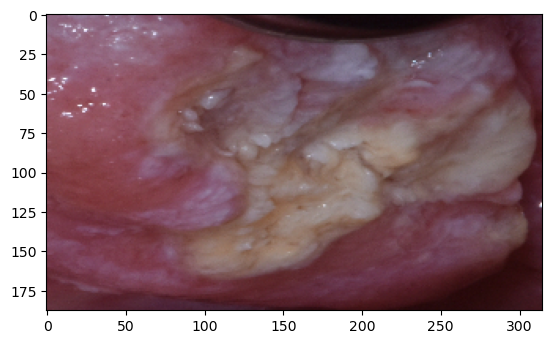

In [75]:
for classe in [0,1,2]:
    print(classe, dict_disease[classe])
    pivots_df = used_pivots_df[used_pivots_df['class'] == classe]
    doc_prots_df = original_prots[original_prots['class'] == classe]
    display(pivots_df)

    nomi_righe =[ dict_disease[x] + '_used_' + name for x, name in zip(pivots_df['class'],pivots_df['names'])]
    

    pivots_imgs = ["./data/images/" + row['names'] for i, row in pivots_df.iterrows()]
    pivots_imgs = [mpimg.imread(file_path) for file_path in pivots_imgs]
    pivots_imgs = [resizing(img) for img in pivots_imgs]

    nomi_righe_resplit = [row['names'] for i, row in pivots_df.iterrows()]
    region_of_interests = [train_data[nome][0]['roi'] for nome in nomi_righe_resplit]

    pivots_cropped_imgs = [crop_img(img, roi) for img, roi in zip(pivots_imgs, region_of_interests)]
    
    for imaa in pivots_cropped_imgs:
        plt.imshow(imaa)
        

    pivots_imgs = pivots_cropped_imgs

    doc_prots_imgs = ["./data/images/" + row['names'] for i, row in doc_prots_df.iterrows()]
    doc_prots_imgs = [mpimg.imread(file_path) for file_path in doc_prots_imgs]
    doc_prots_imgs = [resizing(img)  for img in doc_prots_imgs]

    nomi_righe_resplit = [row['names'] for i, row in doc_prots_df.iterrows()]
    region_of_interests = [train_data[nome][0]['roi'] for nome in nomi_righe_resplit]

    docs_cropped_imgs = [crop_img(img, roi) for img, roi in zip(doc_prots_imgs, region_of_interests)]

    doc_prots_imgs = docs_cropped_imgs

    dist_matrix = []
    for img in pivots_imgs:
        row = []
        for doc_img in doc_prots_imgs:
           # print('computing')
        
            row.append(structural_similarity(img,doc_img, channel_axis = 2))

        dist_matrix.append(row)
        
    distance_matrix = pd.DataFrame(dist_matrix, columns = ['doc_' + row['names'] for i, row in doc_prots_df.iterrows()])
        
    distance_array = np.array(distance_matrix)
    
    # Calculate the mean for each row
    row_means = np.mean(distance_array, axis=1)

    distance_matrix['means'] = row_means
    distance_matrix['class'] = nomi_righe
    
    display(distance_matrix.drop(columns = ['class','means']).apply(lambda x: round(x, 2)))


['node_id:', '0', 'pivot:', '252'] nome_immagine: b5cba561f3b78f82888e82ede2b373c5.JPG, nome_classe: 0


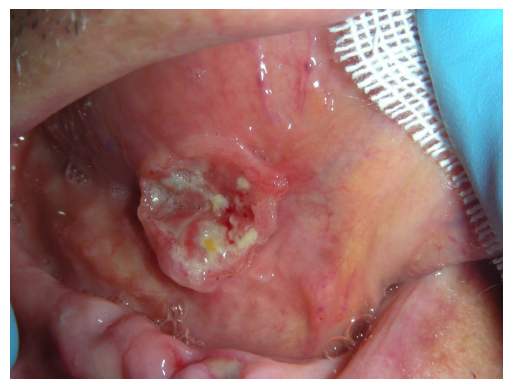

['node_id:', '1', 'pivot:', '197'] nome_immagine: DSC_5044.JPG, nome_classe: 1


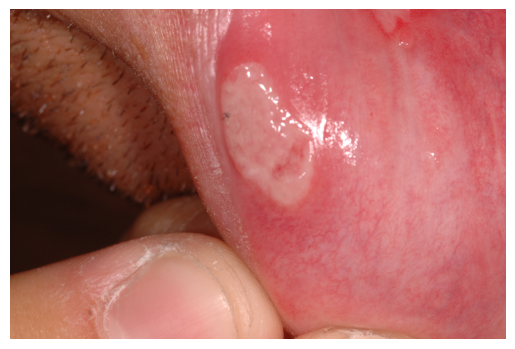

['node_id:', '2', 'pivot:', '33'] nome_immagine: c6a240e21455ccc3ff51fcc6cd74116a.jpg, nome_classe: 2


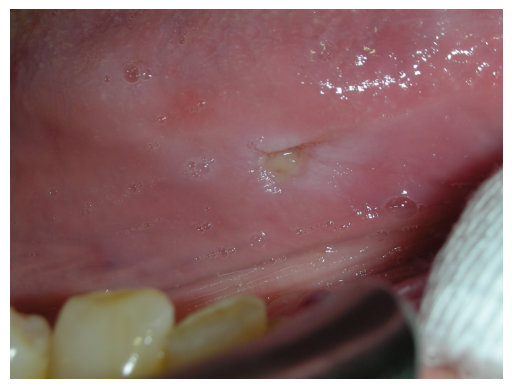

In [44]:
for lista_pivot in used_pivots[0:3]:
    if lista_pivot != None:
        nome_pivot = lista_pivot[0].split()
        id_pivot = nome_pivot[-1]
        
        row = train_val_df.iloc[[id_pivot]]

        classe = row.iloc[0]['class']
        nome = row.iloc[0]['names']

        path = './data/images/' + nome

        print(nome_pivot, f'nome_immagine: {nome}, nome_classe: {classe}')


                # Read the image
        img = mpimg.imread(path)
        
        # Plot the image
        plt.imshow(img)
        plt.axis('off')  # Turn off axis
        plt.show()
        
        
    

In [272]:
aftose_df = train_val_df[train_val_df['names'].isin(aftose)]
traumatiche_df = train_val_df[train_val_df['names'].isin(traumatiche)]
neoplastiche_df = train_val_df[train_val_df['names'].isin(neoplastiche)]